In [125]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from country_converter import CountryConverter

#**1. Understanding the Dataset**

In [91]:
#Set display options to show all columns
pd.set_option('display.max_columns', None)

#Loading the data
fifa21 = pd.read_csv(r'/content/drive/My Drive/Data Analytics/FIFA_21_EDA/fifa21_raw_data.csv')
fifa21.head()

<ipython-input-91-bc6b01966c24>:5: DtypeWarning: Columns (76) have mixed types. Specify dtype option on import or set low_memory=False.
  fifa21 = pd.read_csv(r'/content/drive/My Drive/Data Analytics/FIFA_21_EDA/fifa21_raw_data.csv')


,photoUrl,LongName,playerUrl,Nationality,Positions,Name,Age,↓OVA,POT,Team & Contract,ID,Height,Weight,foot,BOV,BP,Growth,Joined,Loan Date End,Value,Wage,Release Clause,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing Tackle,Sliding Tackle,Goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total Stats,Base Stats,W/F,SM,A/W,D/W,IR,PAC,SHO,PAS,DRI,DEF,PHY,Hits
0,https://cdn.sofifa.com/players/158/023/21_60.png,Lionel Messi,http://sofifa.com/player/158023/lionel-messi/2...,Argentina,RW ST CF,L. Messi,33,93,93,\n\n\n\nFC Barcelona\n2004 ~ 2021\n\n,158023,"5'7""",159lbs,Left,93,RW,0,"Jul 1, 2004",NaN,€67.5M,€560K,€138.4M,429,85,95,70,91,88,470,96,93,94,91,96,451,91,80,91,94,95,389,86,68,72,69,94,347,44,40,93,95,75,96,91,32,35,24,54,6,11,15,14,8,2231,466,4 ★,4★,Medium,Low,5 ★,85,92,91,95,38,65,\n372
1,https://cdn.sofifa.com/players/020/801/21_60.png,C. Ronaldo dos Santos Aveiro,http://sofifa.com/player/20801/c-ronaldo-dos-s...,Portugal,ST LW,Cristiano Ronaldo,35,92,92,\n\n\n\nJuventus\n2018 ~ 2022\n\n,20801,"6'2""",183lbs,Right,92,ST,0,"Jul 10, 2018",NaN,€46M,€220K,€75.9M,437,84,95,90,82,86,414,88,81,76,77,92,431,87,91,87,95,71,444,94,95,84,78,93,353,63,29,95,82,84,95,84,28,32,24,58,7,11,15,14,11,2221,464,4 ★,5★,High,Low,5 ★,89,93,81,89,35,77,\n344
2,https://cdn.sofifa.com/players/200/389/21_60.png,Jan Oblak,http://sofifa.com/player/200389/jan-oblak/210005/,Slovenia,GK,J. Oblak,27,91,93,\n\n\n\nAtlético Madrid\n2014 ~ 2023\n\n,200389,"6'2""",192lbs,Right,91,GK,2,"Jul 16, 2014",NaN,€75M,€125K,€159.4M,95,13,11,15,43,13,109,12,13,14,40,30,307,43,60,67,88,49,268,59,78,41,78,12,140,34,19,11,65,11,68,57,27,12,18,437,87,92,78,90,90,1413,489,3 ★,1★,Medium,Medium,3 ★,87,92,78,90,52,90,\n86
3,https://cdn.sofifa.com/players/192/985/21_60.png,Kevin De Bruyne,http://sofifa.com/player/192985/kevin-de-bruyn...,Belgium,CAM CM,K. De Bruyne,29,91,91,\n\n\n\nManchester City\n2015 ~ 2023\n\n,192985,"5'11""",154lbs,Right,91,CAM,0,"Aug 30, 2015",NaN,€87M,€370K,€161M,407,94,82,55,94,82,441,88,85,83,93,92,398,77,76,78,91,76,408,91,63,89,74,91,408,76,66,88,94,84,91,186,68,65,53,56,15,13,5,10,13,2304,485,5 ★,4★,High,High,4 ★,76,86,93,88,64,78,\n163
4,https://cdn.sofifa.com/players/190/871/21_60.png,Neymar da Silva Santos Jr.,http://sofifa.com/player/190871/neymar-da-silv...,Brazil,LW CAM,Neymar Jr,28,91,91,\n\n\n\nParis Saint-Germain\n2017 ~ 2022\n\n,190871,"5'9""",150lbs,Right,91,LW,0,"Aug 3, 2017",NaN,€90M,€270K,€166.5M,408,85,87,62,87,87,448,95,88,89,81,95,453,94,89,96,91,83,357,80,62,81,50,84,356,51,36,87,90,92,93,94,35,30,29,59,9,9,15,15,11,2175,451,5 ★,5★,High,Medium,5 ★,91,85,86,94,36,59,\n273


In [92]:
#Checking to see the size of the dataset and names of the columns
print(fifa21.shape)
fifa21.columns

(18979, 77)


Index(['photoUrl', 'LongName', 'playerUrl', 'Nationality', 'Positions', 'Name',
       'Age', '↓OVA', 'POT', 'Team & Contract', 'ID', 'Height', 'Weight',
       'foot', 'BOV', 'BP', 'Growth', 'Joined', 'Loan Date End', 'Value',
       'Wage', 'Release Clause', 'Attacking', 'Crossing', 'Finishing',
       'Heading Accuracy', 'Short Passing', 'Volleys', 'Skill', 'Dribbling',
       'Curve', 'FK Accuracy', 'Long Passing', 'Ball Control', 'Movement',
       'Acceleration', 'Sprint Speed', 'Agility', 'Reactions', 'Balance',
       'Power', 'Shot Power', 'Jumping', 'Stamina', 'Strength', 'Long Shots',
       'Mentality', 'Aggression', 'Interceptions', 'Positioning', 'Vision',
       'Penalties', 'Composure', 'Defending', 'Marking', 'Standing Tackle',
       'Sliding Tackle', 'Goalkeeping', 'GK Diving', 'GK Handling',
       'GK Kicking', 'GK Positioning', 'GK Reflexes', 'Total Stats',
       'Base Stats', 'W/F', 'SM', 'A/W', 'D/W', 'IR', 'PAC', 'SHO', 'PAS',
       'DRI', 'DEF', 'PHY', 'Hits

In [ ]:
#Check to see if there are missing values that need to be handled. We see that ~95% of the 'Loan Date End' column is N/A, but this makes sense because not all (and usually the majority) of players are not on loan.

missing_values = fifa21.isna()  # Returns a DataFrame of True/False values

# Count missing values in each column
missing_counts = missing_values.sum()

total_entries = fifa21.shape[0]
missing_percentages = (missing_counts / total_entries) * 100

# Print the percentages of missing values
missing_percentages


In [94]:
#Getting quick statistics on the dataset. Generally, seeing that the max age of a player is 53 is strange and would make me question the validity of the data.
#However, I know that from my knowledge of the sport, there is a Japanese player that still played at 53 (Kazuyoshi Miura, 56 now)
fifa21.describe()

,Age,↓OVA,POT,ID,BOV,Growth,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing Tackle,Sliding Tackle,Goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total Stats,Base Stats,PAC,SHO,PAS,DRI,DEF,PHY
count,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000,18979.000000
mean,25.194583,65.718636,71.136098,226404.790242,66.751620,5.417461,248.938616,49.688551,45.842932,51.941883,58.768007,42.697244,256.481848,55.587913,47.248116,42.392012,52.725012,58.528795,317.721007,64.357922,64.413088,63.367617,61.655619,63.926761,296.606618,57.802413,64.577006,62.654724,64.786132,46.786343,254.200379,55.590969,46.394067,50.299858,53.857158,48.058328,58.073608,139.908689,46.558828,47.705359,45.644502,81.436693,16.416197,16.207124,16.076558,16.217609,16.519205,1595.293851,355.703040,67.454239,53.457716,57.681069,62.875494,49.865904,64.368618
std,4.710753,6.968999,6.114176,27141.673349,6.747017,5.663954,74.299764,18.131334,19.566978,17.293626,14.518995,17.647116,78.652897,18.761660,18.208857,17.228069,15.177695,16.566286,55.881422,14.890208,14.638874,14.597144,9.072114,14.062703,50.733368,13.308980,11.844592,15.804986,12.488690,19.300862,64.596228,17.140038,20.697516,19.429171,13.708607,15.655890,12.079042,61.218624,20.138813,21.367322,20.922167,84.665579,17.554221,16.816305,16.491064,17.002134,17.854185,269.883542,40.762282,10.678058,13.827229,10.081914,9.927875,16.442730,9.601665
min,16.000000,47.000000,47.000000,41.000000,48.000000,0.000000,42.000000,6.000000,3.000000,5.000000,7.000000,3.000000,40.000000,5.000000,4.000000,5.000000,5.000000,5.000000,122.000000,13.000000,12.000000,14.000000,24.000000,12.000000,122.000000,18.000000,15.000000,12.000000,16.000000,4.000000,50.000000,9.000000,3.000000,2.000000,9.000000,6.000000,12.000000,20.000000,3.000000,5.000000,4.000000,10.000000,2.000000,2.000000,2.000000,2.000000,2.000000,747.000000,232.000000,25.000000,16.000000,25.000000,25.000000,12.000000,28.000000
25%,21.000000,61.000000,67.000000,210135.000000,62.000000,0.000000,222.000000,38.000000,30.000000,44.000000,54.000000,30.000000,222.000000,49.000000,35.000000,31.000000,43.000000,54.000000,289.000000,57.000000,57.000000,55.000000,56.000000,56.000000,264.000000,48.000000,58.000000,55.000000,57.000000,32.000000,227.500000,44.000000,25.000000,40.000000,45.000000,39.000000,50.000000,83.000000,29.000000,27.000000,25.000000,48.000000,8.000000,8.000000,8.000000,8.000000,8.000000,1452.000000,327.000000,61.000000,44.000000,51.000000,57.000000,35.000000,58.000000
50%,25.000000,66.000000,71.000000,232424.000000,67.000000,4.000000,263.000000,54.000000,49.000000,55.000000,62.000000,44.000000,269.000000,61.000000,49.000000,41.000000,56.000000,63.000000,327.000000,67.000000,67.000000,66.000000,62.000000,66.000000,302.000000,59.000000,65.000000,66.000000,66.000000,51.000000,263.000000,58.000000,53.000000,55.000000,55.000000,49.000000,59.000000,159.000000,52.000000,55.000000,52.000000,53.000000,11.000000,11.000000,11.000000,11.000000,11.000000,1627.000000,356.000000,68.000000,56.000000,58.000000,64.000000,53.000000,6

In [95]:
#Quick check to validate that the 53 year old player is Kazuyoshi Miura
fifa21.query('Age == 53')

,photoUrl,LongName,playerUrl,Nationality,Positions,Name,Age,↓OVA,POT,Team & Contract,ID,Height,Weight,foot,BOV,BP,Growth,Joined,Loan Date End,Value,Wage,Release Clause,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing Tackle,Sliding Tackle,Goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total Stats,Base Stats,W/F,SM,A/W,D/W,IR,PAC,SHO,PAS,DRI,DEF,PHY,Hits
16121,https://cdn.sofifa.com/players/254/704/21_60.png,Kazuyoshi Miura,http://sofifa.com/player/254704/kazuyoshi-miur...,Japan,ST,K. Miura,53,59,59,\n\n\n\nYokohama FC\n2005 ~ 2021\n\n,254704,"5'10""",159lbs,Right,60,CF,0,"Jul 1, 2005",NaN,€0,€850,€0,289,44,66,56,61,62,290,63,69,54,36,68,187,24,26,27,48,62,235,59,32,21,62,61,257,45,16,71,66,59,77,42,16,13,13,41,6,14,8,6,7,1341,269,4 ★,2★,Low,Low,1 ★,25,63,55,60,19,47,\n96


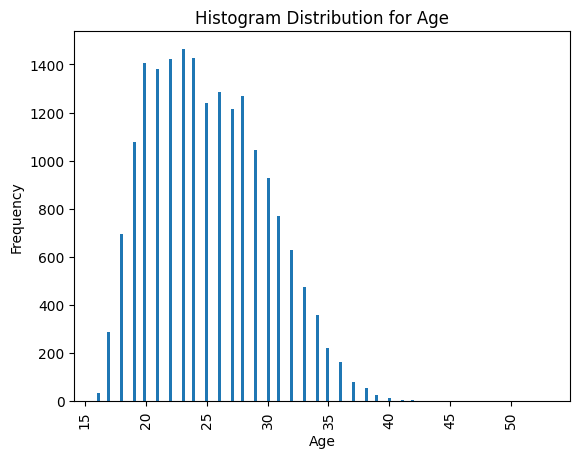

In [126]:
#Plotting an age distribution histogram just to see if there are any other suspicious values that seem too high to too low
plt.hist(fifa21['Age'], bins = int(np.ceil(np.sqrt(len(fifa21)))))
plt.xticks(rotation = 'vertical')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Histogram Distribution for Age')
plt.show()

# **2. Data Preprocessing & Feature Engineering**
After inspecting each column of the dataset, I realized that there are a few columns that need to be altered in order to make it suitable for analysis. These columns include: 'Height', 'Joined', 'Release Clause', 'Wage', 'Value','Weight', 'IR', 'WF', 'SM', 'Hits' and 'Team & Contract'. I also decided to add a column for the continent, as this can be important to compare the distribution of players by continents.

---

In [96]:
#The 'Height' is of type string because of the ' and ". I will change the height to centimetres because generally, that is the unit of measurement used for the height in the game.
fifa21['Height']

0         5'7"
1         6'2"
2         6'2"
3        5'11"
4         5'9"
5         6'0"
6        5'10"
7         6'3"
8         5'9"
9         5'9"
10        6'4"
11        6'2"
12        6'1"
13        6'6"
14        6'4"
15        6'1"
16        6'0"
17        5'8"
18        5'6"
19        5'9"
20       5'10"
21        6'2"
22        5'7"
23        6'2"
24        6'2"
25        5'9"
26        6'0"
27        6'4"
28       5'11"
29       5'11"
30        5'8"
31       5'10"
32        6'2"
33       5'10"
34        6'2"
35       5'11"
36        6'0"
37        5'9"
38        6'1"
39        6'1"
40        6'2"
41        6'2"
42        6'5"
43       5'11"
44        5'8"
45        6'0"
46        6'2"
47        6'2"
48       5'10"
49        5'8"
50        6'3"
51        5'5"
52        6'3"
53        6'4"
54        6'1"
55        5'7"
56        6'0"
57        6'3"
58        6'0"
59        5'8"
60        6'4"
61        5'6"
62        6'2"
63        6'2"
64        6'2"
65        6'3"
66        

In [97]:
def convert_to_inches_to_cm(height):
  """
  Converts a height value from feet and inches to centimeters.
  """
  #Splitting the height value into feet and inches components
  feet, inches = height.split("'")

  #Calculating the total inches by converting feet to inches and adding inches component
  tot_inches = int(feet) * 12 + int(inches.replace('"', ""))

  #Converting total inches to centimeters using the conversion factor (1 inch = 2.54 cm)
  cm = tot_inches * 2.54
  return cm

#Apply function to the column
fifa21['Height'] = fifa21['Height'].apply(convert_to_inches_to_cm)

In [98]:
#The 'Joined' column is of type object with the date (month, day, year) for when the player joined a club.
fifa21['Joined']

0         Jul 1, 2004
1        Jul 10, 2018
2        Jul 16, 2014
3        Aug 30, 2015
4         Aug 3, 2017
5         Jul 1, 2014
6         Jul 1, 2018
7        Jul 19, 2018
8         Jul 1, 2017
9         Jul 1, 2016
10        Jan 1, 2018
11        Jul 1, 2014
12       Jul 11, 2013
13        Aug 9, 2018
14        Jul 1, 2011
15        Jul 9, 2009
16        Aug 1, 2005
17       Jul 28, 2011
18       Jul 16, 2016
19        Jul 1, 2015
20        Jul 1, 2015
21        Jul 1, 2017
22       Jul 14, 2015
23        Jul 1, 2010
24        Jul 1, 2014
25        Jul 1, 2019
26       Jul 17, 2014
27        Jul 1, 2012
28       Aug 31, 2017
29        Oct 7, 2015
30        Jul 1, 2017
31       Jul 21, 2017
32       Jan 30, 2018
33       Jan 30, 2020
34        Jul 1, 2018
35        Jul 6, 2015
36       Aug 28, 2015
37       Jul 12, 2019
38        Sep 2, 2019
39       Jul 27, 2016
40        Sep 1, 2008
41       Jan 31, 2018
42       Jul 19, 2017
43        Aug 6, 2015
44        Aug 1, 2012
45       S

In [99]:
#I will change the data type to datetime and create 3 separate columns for each month, day, year.
fifa21['Joined'] = pd.to_datetime(fifa21['Joined'])
fifa21['Joined_Month'] = fifa21['Joined'].dt.month
fifa21['Joined_Year'] = fifa21['Joined'].dt.year
fifa21['Joined_Day'] = fifa21['Joined'].dt.day

In [100]:
#'Release Clause', 'Wage' and 'Value' are all columns that should be of type integer but are strings due to the currency sign and abbrevations for millions (M) and thousands (K)
print(fifa21['Release Clause'])
print(fifa21['Wage'])
fifa21['Value']

0        €138.4M
1         €75.9M
2        €159.4M
3          €161M
4        €166.5M
5          €132M
6        €203.1M
7        €120.3M
8        €144.3M
9        €144.3M
10       €145.3M
11       €147.7M
12         €122M
13         €119M
14        €47.9M
15       €108.7M
16        €50.2M
17        €98.1M
18        €96.9M
19       €112.1M
20       €122.5M
21         €103M
22       €139.6M
23       €140.2M
24          €85M
25       €118.9M
26       €112.8M
27        €27.2M
28       €132.1M
29       €115.5M
30       €115.5M
31         €102M
32       €107.8M
33       €124.4M
34       €104.9M
35        €96.2M
36        €99.8M
37       €103.5M
38          €50M
39        €82.5M
40        €77.9M
41        €85.5M
42        €56.1M
43        €72.2M
44        €50.2M
45        €64.6M
46        €51.3M
47        €25.6M
48        €53.2M
49        €77.9M
50        €98.8M
51        €96.3M
52        €98.8M
53        €59.9M
54        €69.3M
55        €65.6M
56        €67.5M
57        €56.1M
58        €48.

0         €67.5M
1           €46M
2           €75M
3           €87M
4           €90M
5           €80M
6        €105.5M
7         €62.5M
8           €78M
9           €78M
10        €75.5M
11        €69.5M
12        €59.5M
13          €56M
14          €29M
15          €53M
16        €24.5M
17          €53M
18          €51M
19          €65M
20          €71M
21        €53.5M
22        €72.5M
23          €71M
24          €50M
25          €58M
26          €55M
27          €16M
28        €69.5M
29          €60M
30          €60M
31          €53M
32          €56M
33          €63M
34        €54.5M
35          €52M
36        €52.5M
37        €50.5M
38          €27M
39        €48.5M
40          €38M
41          €45M
42          €34M
43          €39M
44        €24.5M
45        €31.5M
46          €27M
47        €15.5M
48          €28M
49          €38M
50        €46.5M
51          €50M
52          €50M
53        €31.5M
54          €42M
55          €32M
56        €36.5M
57          €33M
58        €28.

In [101]:
#For all three columns, I will change every value by removing the €, M and K, and applying the correct magnitude (1000000 or 1000). Columns will also be of type integer.
fifa21['Release Clause'] = fifa21['Release Clause'].apply(lambda x: float(x.replace('€', '').replace('K', '')) * 1000
                                    if 'K' in x
                                    else float(x.replace('€', '').replace('M', '')) * 1000000
                                    if 'M' in x
                                    else float(x.replace('€', ''))).astype(int)

fifa21['Wage'] = fifa21['Wage'].apply(lambda x: float(x.replace('€', '').replace('K',''))*1000
                                                      if 'K' in x
                                                      else float(x.replace('€', '').replace('M',''))*1000000
                                                      if 'M' in x
                                                      else float(x.replace('€', ''))).astype(int)

fifa21['Value'] = fifa21['Value'].apply(lambda x: float(x.replace('€', '').replace('K', '')) * 1000
                                        if 'K' in x
                                        else float(x.replace('€', '').replace('M','')) *1000000
                                        if 'M' in x
                                        else float(x.replace('€', ''))).astype(int)

In [102]:
#The "Weight" column is of type object because of the "lbs" abbreviation.
fifa21['Weight']

0        159lbs
1        183lbs
2        192lbs
3        154lbs
4        150lbs
5        176lbs
6        161lbs
7        201lbs
8        157lbs
9        152lbs
10       203lbs
11       187lbs
12       185lbs
13       212lbs
14       203lbs
15       179lbs
16       181lbs
17       154lbs
18       154lbs
19       161lbs
20       165lbs
21       190lbs
22       152lbs
23       196lbs
24       196lbs
25       163lbs
26       168lbs
27       203lbs
28       168lbs
29       152lbs
30       141lbs
31       141lbs
32       187lbs
33       152lbs
34       172lbs
35       168lbs
36       172lbs
37       161lbs
38       176lbs
39       187lbs
40       168lbs
41       176lbs
42       198lbs
43       152lbs
44       146lbs
45       183lbs
46       181lbs
47       187lbs
48       163lbs
49       161lbs
50       179lbs
51       132lbs
52       185lbs
53       181lbs
54       165lbs
55       150lbs
56       176lbs
57       207lbs
58       174lbs
59       148lbs
60       187lbs
61       150lbs
62      

In [103]:
#To make it an integer, I will remove the abbrevation and change the type of the column.
fifa21['Weight'] = fifa21['Weight'].apply(lambda x: x.replace('lbs', ''))
fifa21['Weight'] = fifa21['Weight'].astype(int)
fifa21['Weight']

0        159
1        183
2        192
3        154
4        150
5        176
6        161
7        201
8        157
9        152
10       203
11       187
12       185
13       212
14       203
15       179
16       181
17       154
18       154
19       161
20       165
21       190
22       152
23       196
24       196
25       163
26       168
27       203
28       168
29       152
30       141
31       141
32       187
33       152
34       172
35       168
36       172
37       161
38       176
39       187
40       168
41       176
42       198
43       152
44       146
45       183
46       181
47       187
48       163
49       161
50       179
51       132
52       185
53       181
54       165
55       150
56       176
57       207
58       174
59       148
60       187
61       150
62       183
63       196
64       176
65       181
66       154
67       198
68       163
69       168
70       165
71       179
72       168
73       154
74       143
75       165
76       165

In [104]:
#We see that these columns have starts that are unecessary.
print(fifa21['IR'])
print(fifa21['W/F'])
fifa21['SM']

Streaming output truncated to the last 5000 lines.
13980    2 ★
13981    4 ★
13982    2 ★
13983    2 ★
13984    3 ★
13985    3 ★
13986    3 ★
13987    3 ★
13988    3 ★
13989    3 ★
13990    2 ★
13991    3 ★
13992    2 ★
13993    3 ★
13994    3 ★
13995    3 ★
13996    2 ★
13997    3 ★
13998    3 ★
13999    3 ★
14000    3 ★
14001    3 ★
14002    2 ★
14003    3 ★
14004    3 ★
14005    3 ★
14006    2 ★
14007    2 ★
14008    2 ★
14009    3 ★
14010    3 ★
14011    2 ★
14012    2 ★
14013    4 ★
14014    3 ★
14015    4 ★
14016    3 ★
14017    3 ★
14018    4 ★
14019    2 ★
14020    3 ★
14021    2 ★
14022    3 ★
14023    3 ★
14024    2 ★
14025    3 ★
14026    3 ★
14027    3 ★
14028    2 ★
14029    3 ★
14030    3 ★
14031    3 ★
14032    3 ★
14033    3 ★
14034    2 ★
14035    3 ★
14036    3 ★
14037    2 ★
14038    3 ★
14039    3 ★
14040    3 ★
14041    4 ★
14042    2 ★
14043    2 ★
14044    3 ★
14045    3 ★
14046    3 ★
14047    3 ★
14048    3 ★
14049    3 ★
14050    3 ★
14051    3 ★
14052    2 ★


0        4★
1        5★
2        1★
3        4★
4        5★
5        4★
6        5★
7        1★
8        4★
9        4★
10       2★
11       1★
12       2★
13       1★
14       1★
15       4★
16       3★
17       4★
18       2★
19       3★
20       4★
21       1★
22       4★
23       3★
24       2★
25       4★
26       3★
27       1★
28       5★
29       3★
30       4★
31       3★
32       2★
33       4★
34       3★
35       5★
36       4★
37       4★
38       1★
39       3★
40       3★
41       4★
42       1★
43       5★
44       4★
45       3★
46       1★
47       2★
48       3★
49       3★
50       2★
51       4★
52       5★
53       1★
54       3★
55       3★
56       3★
57       3★
58       1★
59       4★
60       2★
61       4★
62       4★
63       2★
64       2★
65       3★
66       5★
67       1★
68       4★
69       4★
70       4★
71       2★
72       3★
73       3★
74       5★
75       3★
76       4★
77       5★
78       5★
79       3★
80       4★
81       4★
82       3★
83  

In [105]:
#The stars are removed and data type is changed to integer for each column
fifa21['IR'] = fifa21['IR'].apply(lambda x: x.replace('★', '')).astype(int)
fifa21['W/F'] = fifa21['W/F'].apply(lambda x: x.replace('★', '')).astype(int)
fifa21['SM'] = fifa21['SM'].apply(lambda x: x.replace('★', '')).astype(int)
print(fifa21['IR'])
print(fifa21['W/F'])
fifa21['SM']

0        5
1        5
2        3
3        4
4        5
5        4
6        3
7        3
8        3
9        3
10       3
11       3
12       3
13       4
14       5
15       4
16       4
17       4
18       3
19       3
20       3
21       2
22       3
23       3
24       3
25       4
26       4
27       3
28       3
29       2
30       2
31       3
32       2
33       2
34       3
35       3
36       3
37       4
38       3
39       3
40       4
41       3
42       3
43       4
44       4
45       5
46       4
47       4
48       3
49       3
50       3
51       3
52       4
53       4
54       4
55       3
56       2
57       4
58       3
59       4
60       4
61       3
62       3
63       3
64       1
65       2
66       2
67       3
68       3
69       2
70       2
71       2
72       3
73       3
74       3
75       3
76       3
77       3
78       3
79       3
80       2
81       3
82       3
83       3
84       3
85       3
86       3
87       2
88       3
89       3
90       4

0        4
1        5
2        1
3        4
4        5
5        4
6        5
7        1
8        4
9        4
10       2
11       1
12       2
13       1
14       1
15       4
16       3
17       4
18       2
19       3
20       4
21       1
22       4
23       3
24       2
25       4
26       3
27       1
28       5
29       3
30       4
31       3
32       2
33       4
34       3
35       5
36       4
37       4
38       1
39       3
40       3
41       4
42       1
43       5
44       4
45       3
46       1
47       2
48       3
49       3
50       2
51       4
52       5
53       1
54       3
55       3
56       3
57       3
58       1
59       4
60       2
61       4
62       4
63       2
64       2
65       3
66       5
67       1
68       4
69       4
70       4
71       2
72       3
73       3
74       5
75       3
76       4
77       5
78       5
79       3
80       4
81       4
82       3
83       1
84       3
85       3
86       4
87       3
88       5
89       3
90       4

In [106]:
#For the 'Hits' column, we see that there are newlines for some values and any value above 999 gets the 'K' abbreviation.
fifa21['Hits']

0         \n372
1         \n344
2          \n86
3         \n163
4         \n273
5         \n182
6         \n646
7          \n79
8         \n164
9         \n170
10        \n170
11         \n93
12        \n131
13         \n89
14         \n90
15        \n169
16        \n187
17        \n103
18        \n169
19        \n317
20        \n239
21         \n56
22        \n130
23        \n229
24        \n124
25        \n172
26        \n114
27         \n46
28        \n663
29        \n479
30        \n203
31        \n198
32        \n122
33        \n565
34        \n152
35        \n140
36        \n276
37        \n209
38         \n25
39        \n136
40        \n109
41        \n139
42         \n42
43         \n99
44        \n137
45        \n166
46         \n56
47         \n80
48        \n104
49         \n89
50        \n150
51        \n112
52        \n285
53        \n133
54         \n96
55         \n69
56        \n143
57        \n100
58         \n38
59         \n83
60         \n67
61        \n207
62      

In [107]:
# Custom function to replace newline characters and then multiply any value with 'K' by 1000 after removing it.
fifa21['Hits'] = fifa21['Hits'].astype(str)


def replace_newline(value):
  """
    Replaces newline characters ('\n') in a given string with spaces.
  """
  #Check if the input string contains newline characters
  if '\n' in value:
      #If newline characters are present, replace them with spaces
      return value.replace('\n', ' ')
  else:
      #If no newline characters are present, return the input string as is
      return value

#Apply the custom function to the 'Hits' column
fifa21['Hits'] = fifa21['Hits'].apply(replace_newline)

#Remove 'K' from values and multiply them by 1000
fifa21['Hits'] = fifa21['Hits'].apply(lambda x: float(x.replace('K',''))*1000 if 'K' in x else x).astype(int)
fifa21['Hits']

0         372
1         344
2          86
3         163
4         273
5         182
6         646
7          79
8         164
9         170
10        170
11         93
12        131
13         89
14         90
15        169
16        187
17        103
18        169
19        317
20        239
21         56
22        130
23        229
24        124
25        172
26        114
27         46
28        663
29        479
30        203
31        198
32        122
33        565
34        152
35        140
36        276
37        209
38         25
39        136
40        109
41        139
42         42
43         99
44        137
45        166
46         56
47         80
48        104
49         89
50        150
51        112
52        285
53        133
54         96
55         69
56        143
57        100
58         38
59         83
60         67
61        207
62        416
63        315
64        206
65        124
66        424
67        191
68        454
69        271
70        249
71    

In [108]:
#This column is very messy as it has many new lines. It also doesn't make sense to have the team name and contract in one column
fifa21['Team & Contract']

0                    \n\n\n\nFC Barcelona\n2004 ~ 2021\n\n
1                        \n\n\n\nJuventus\n2018 ~ 2022\n\n
2                 \n\n\n\nAtlético Madrid\n2014 ~ 2023\n\n
3                 \n\n\n\nManchester City\n2015 ~ 2023\n\n
4             \n\n\n\nParis Saint-Germain\n2017 ~ 2022\n\n
5               \n\n\n\nFC Bayern München\n2014 ~ 2023\n\n
6             \n\n\n\nParis Saint-Germain\n2018 ~ 2022\n\n
7                       \n\n\n\nLiverpool\n2018 ~ 2024\n\n
8                       \n\n\n\nLiverpool\n2017 ~ 2023\n\n
9                       \n\n\n\nLiverpool\n2016 ~ 2023\n\n
10                      \n\n\n\nLiverpool\n2018 ~ 2023\n\n
11                   \n\n\n\nFC Barcelona\n2014 ~ 2022\n\n
12                    \n\n\n\nReal Madrid\n2013 ~ 2023\n\n
13                    \n\n\n\nReal Madrid\n2018 ~ 2024\n\n
14              \n\n\n\nFC Bayern München\n2011 ~ 2023\n\n
15                    \n\n\n\nReal Madrid\n2009 ~ 2022\n\n
16                    \n\n\n\nReal Madrid\n2005 ~ 2021\n

In [109]:
#I will first use the replace_newline function to remove all existing new lines in the 'Team & Contract' column
fifa21['Team & Contract'] = fifa21['Team & Contract'].astype(str)
fifa21['Team & Contract'] = fifa21['Team & Contract'].apply(replace_newline)

#Then, I will create two more columns (Team and Contract) by splitting the 'Team & Contract' column

#Split column at the '2' of the beginning year of the contract
team_contract = fifa21['Team & Contract'].str.split('2', n=1, expand = True)

#Columns 'Team' and 'Contract' have been created
team_contract.columns = ['Team', 'Contract']

#I lost the 2 for the beginning year when splitting the column so this function will add it back
def add_prefix(entry):
  if entry is not None:
    return '2' + entry
  else:
    return None

#Apply function to the column
team_contract['Contract'] = team_contract['Contract'].apply(add_prefix)

#Concatenate the two columns to the dataset
fifa21 = pd.concat([fifa21, team_contract], axis = 1)
fifa21

In [115]:
#Installing the 'country-converter' library. It provides a convenient way to get the continent of each country. It will be useful for creating the continent column.
!pip install country-converter

In [118]:
#Create a CountryConverter instance
cc = CountryConverter()

#Function to preprocess and get continent from country
def get_continent(country_name):
    # Preprocess the country name (e.g., lower case, stripping spaces)
    processed_country_name = country_name.lower().strip()
    try:
        return cc.convert(names=processed_country_name, to='continent')[0]
    except:
        return 'Unknown'

#Create a new 'Continent' column based on 'Nationality'
fifa21['Continent'] = fifa21['Nationality'].apply(get_continent)

#CountryConverter did not consider the UK as part of Europe and any unknown country gets a value of n, so I changed this manually.
fifa21['Continent'] = fifa21['Continent'].replace('n' , 'E')
# Display a few rows with the new 'Continent' column
print(fifa21[['Nationality', 'Continent']].head())


  Nationality Continent
0   Argentina         A
1    Portugal         E
2    Slovenia         E
3     Belgium         E
4      Brazil         A


In [119]:
fifa21.head()

,photoUrl,LongName,playerUrl,Nationality,Positions,Name,Age,↓OVA,POT,Team & Contract,ID,Height,Weight,foot,BOV,BP,Growth,Joined,Loan Date End,Value,Wage,Release Clause,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing Tackle,Sliding Tackle,Goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total Stats,Base Stats,W/F,SM,A/W,D/W,IR,PAC,SHO,PAS,DRI,DEF,PHY,Hits,Joined_Month,Joined_Year,Joined_Day,Team,Contract,Continent
0,https://cdn.sofifa.com/players/158/023/21_60.png,Lionel Messi,http://sofifa.com/player/158023/lionel-messi/2...,Argentina,RW ST CF,L. Messi,33,93,93,FC Barcelona 2004 ~ 2021,158023,170.18,159,Left,93,RW,0,2004-07-01,NaN,67500000,560000,138400000,429,85,95,70,91,88,470,96,93,94,91,96,451,91,80,91,94,95,389,86,68,72,69,94,347,44,40,93,95,75,96,91,32,35,24,54,6,11,15,14,8,2231,466,4,4,Medium,Low,5,85,92,91,95,38,65,372,7,2004,1,FC Barcelona,2004 ~ 2021,A
1,https://cdn.sofifa.com/players/020/801/21_60.png,C. Ronaldo dos Santos Aveiro,http://sofifa.com/player/20801/c-ronaldo-dos-s...,Portugal,ST LW,Cristiano Ronaldo,35,92,92,Juventus 2018 ~ 2022,20801,187.96,183,Right,92,ST,0,2018-07-10,NaN,46000000,220000,75900000,437,84,95,90,82,86,414,88,81,76,77,92,431,87,91,87,95,71,444,94,95,84,78,93,353,63,29,95,82,84,95,84,28,32,24,58,7,11,15,14,11,2221,464,4,5,High,Low,5,89,93,81,89,35,77,344,7,2018,10,Juventus,2018 ~ 2022,E
2,https://cdn.sofifa.com/players/200/389/21_60.png,Jan Oblak,http://sofifa.com/player/200389/jan-oblak/210005/,Slovenia,GK,J. Oblak,27,91,93,Atlético Madrid 2014 ~ 2023,200389,187.96,192,Right,91,GK,2,2014-07-16,NaN,75000000,125000,159400000,95,13,11,15,43,13,109,12,13,14,40,30,307,43,60,67,88,49,268,59,78,41,78,12,140,34,19,11,65,11,68,57,27,12,18,437,87,92,78,90,90,1413,489,3,1,Medium,Medium,3,87,92,78,90,52,90,86,7,2014,16,Atlético Madrid,2014 ~ 2023,E
3,https://cdn.sofifa.com/players/192/985/21_60.png,Kevin De Bruyne,http://sofifa.com/player/192985/kevin-de-bruyn...,Belgium,CAM CM,K. De Bruyne,29,91,91,Manchester City 2015 ~ 2023,192985,180.34,154,Right,91,CAM,0,2015-08-30,NaN,87000000,370000,161000000,407,94,82,55,94,82,441,88,85,83,93,92,398,77,76,78,91,76,408,91,63,89,74,91,408,76,66,88,94,84,91,186,68,65,53,56,15,13,5,10,13,2304,485,5,4,High,High,4,76,86,93,88,64,78,163,8,2015,30,Manchester City,2015 ~ 2023,E
4,https://cdn.sofifa.com/players/190/871/21_60.png,Neymar da Silva Santos Jr.,http://sofifa.com/player/190871/neymar-da-silv...,Brazil,LW CAM,Neymar Jr,28,91,91,Paris Saint-Germain 2017 ~ 2022,190871,175.26,150,Right,91,LW,0,2017-08-03,NaN,90000000,270000,166500000,408,85,87,62,87,87,448,95,88,89,81,95,453,94,89,96,91,83,357,80,62,81,50,84,356,51,36,87,90,92,93,94,35,30,29,59,9,9,15,15,11,2175,451,5,5,High,Medium,5,91,85,86,94,36,59,273,8,2017,3,Paris Saint-Germain,2017 ~ 2022,A
